# Representational Geodesic

NOTE: This notebook and the geodesic method are still under construction and subject to change. They will run, but might not find the most informative geodesic.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
# so that relative sizes of axes created by po.imshow and others look right
plt.rcParams['figure.dpi'] = 72
%matplotlib inline

import pyrtools as pt
import plenoptic as po
from plenoptic.tools import to_numpy
%load_ext autoreload
%autoreload 2

import torch
import torch.nn as nn
# this notebook uses torchvision, which is an optional dependency.
# if this fails, install torchvision in your plenoptic environment 
# and restart the notebook kernel.
try:
    import torchvision
except ModuleNotFoundError:
    raise ModuleNotFoundError("optional dependency torchvision not found!"
                              " please install it in your plenoptic environment "
                              "and restart the notebook kernel")
import torchvision.transforms as transforms
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dtype  = torch.float32
torch.__version__

'2.3.1+cu121'

## Translation

Image statistics:
  Range: [0.079997, 1.000000]
  Mean: 0.488417,  Stdev: 0.149090,  Kurtosis: 3.337172
Image statistics:
  Range: [0.000000, 0.741736]
  Mean: 0.354389,  Stdev: 0.212748,  Kurtosis: 1.725743
torch.Size([1, 1, 32, 32])
torch.Size([21, 1, 32, 32])


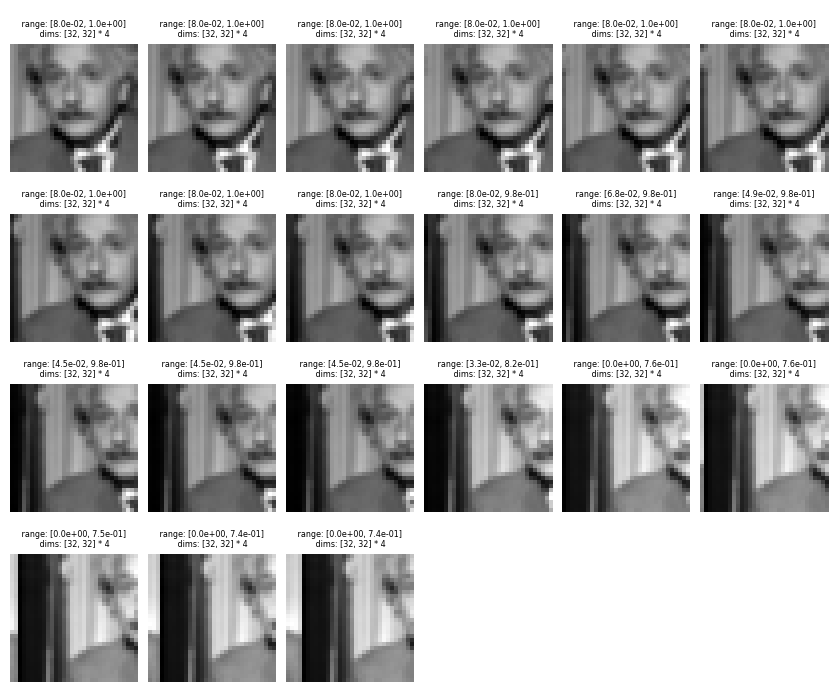

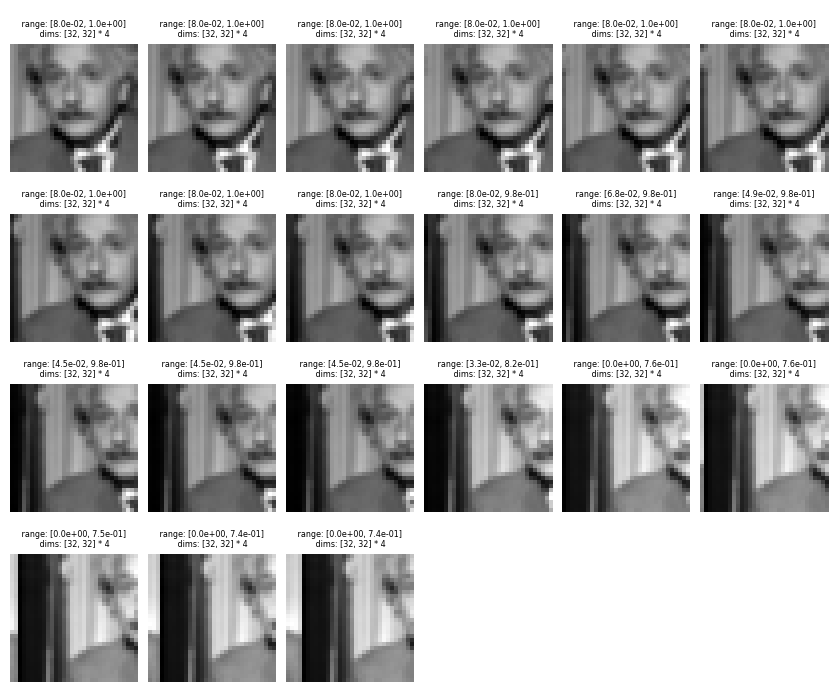

In [2]:
image_size = 64
einstein = po.data.einstein()
einstein = po.tools.conv.blur_downsample(einstein, n_scales=2)
vid = po.tools.translation_sequence(einstein, n_steps=20)
vid = po.tools.center_crop(vid, image_size // 2)
vid = po.tools.rescale(vid, 0, 1)

imgA = vid[0:1]
imgB = vid[-1:]

pt.image_stats(to_numpy(imgA))
pt.image_stats(to_numpy(imgB))
print(imgA.shape)
print(vid.shape)

# convention: full name for numpy arrays, short hands for torch tensors
video = to_numpy(vid)

po.imshow(video, zoom=4, col_wrap=6)

### Spectral models
Computing a geodesic to reveal excess invariance of the global Fourier magnitude representation.

In [3]:
import torch.fft


class Fourier(nn.Module):
    def __init__(self, representation="amp"):
        super().__init__()
        self.representation = representation

    def spectrum(self, x):
        return torch.fft.rfftn(x, dim=(2, 3))

    def forward(self, x):
        if self.representation == "amp":
            return torch.abs(self.spectrum(x))
        elif self.representation == "phase":
            return torch.angle(self.spectrum(x))
        elif self.representation == "rectangular":
            return self.spectrum(x)
        elif self.representation == "polar":
            return torch.cat(
                (torch.abs(self.spectrum(x)), torch.angle(self.spectrum(x))), dim=1
            )


model = Fourier("amp")
# model = Fourier('polar') # note: need pytorch>=1.8 to take gradients through torch.angle

In [4]:
n_steps = len(video) - 1
moog = po.synth.Geodesic(imgA, imgB, model, n_steps, initial_sequence="bridge")
optim = torch.optim.Adam([moog._geodesic], lr=0.01, amsgrad=True)
moog.synthesize(max_iter=500, optimizer=optim, store_progress=True)


 Stop criterion for pixel_change_norm = 1.07149e-02


/mnt/home/hdettki/code/plenoptic/src/plenoptic/tools/validate.py:178: UserWarning: model is in training mode, you probably want to call eval() to switch to evaluation mode
  warnings.warn(


  0%|          | 0/500 [00:00<?, ?it/s]

/mnt/home/hdettki/code/plenoptic/src/plenoptic/synthesize/geodesic.py:194: UserWarning: Pixel change norm has converged, stopping synthesis
  warnings.warn("Pixel change norm has converged, stopping synthesis")


<Axes: title={'center': 'Deviation from the straight line'}, xlabel='Distance along representation line', ylabel='Distance from representation line'>

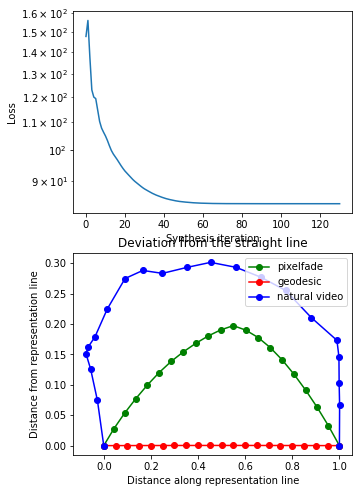

In [5]:
fig, axes = plt.subplots(2, 1, figsize=(5, 8))
po.synth.geodesic.plot_loss(moog, ax=axes[0])
po.synth.geodesic.plot_deviation_from_line(moog, vid, ax=axes[1])

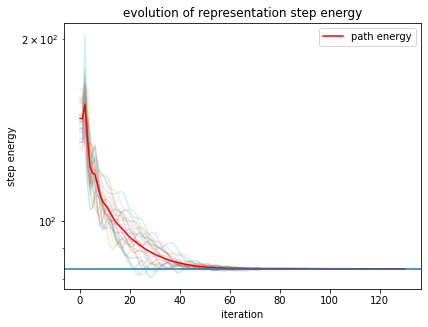

In [6]:
plt.plot(po.to_numpy(moog.step_energy), alpha=0.2)
plt.plot(moog.step_energy.mean(1), "r-", label="path energy")
plt.axhline(
    torch.linalg.vector_norm(moog.model(moog.image_a) - moog.model(moog.image_b), ord=2)
    ** 2
    / moog.n_steps**2
)
plt.legend()
plt.title("evolution of representation step energy")
plt.ylabel("step energy")
plt.xlabel("iteration")
plt.yscale("log")
plt.show()

Text(0.5, 1.0, 'final representation step jerkiness')

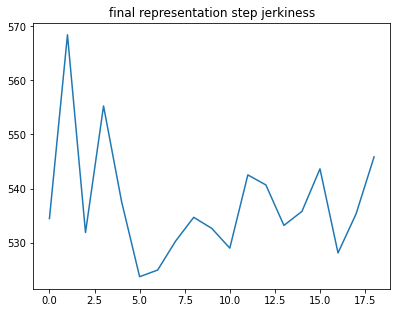

In [7]:
plt.plot(moog.calculate_jerkiness().detach())
plt.title("final representation step jerkiness")

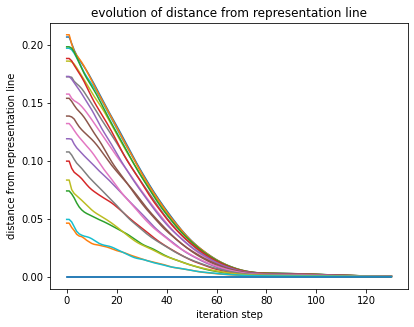

In [8]:
plt.plot(po.to_numpy(moog.dev_from_line[..., 1]))

plt.title("evolution of distance from representation line")
plt.ylabel("distance from representation line")
plt.xlabel("iteration step")
plt.show()

In [9]:
# original: imshow with PT 
pixelfade = to_numpy(moog.pixelfade.squeeze())
geodesic = to_numpy(moog.geodesic.squeeze())
# po.imshow expexts image to be of shape (batch, channel, height,width)

fig = pt.imshow([video[5], pixelfade[5], geodesic[5]],
          title=['video', 'pixelfade', 'geodesic'],
          col_wrap=3, zoom=4)

size = geodesic.shape[-1]
h, m , l = (size//2 + size//4, size//2, size//2 - size//4)

# for a in fig.get_axes()[0]:
a = fig.get_axes()[0]
for line in (h, m, l):
    a.axhline(line, lw=2)

pt.imshow([video[:,l], pixelfade[:,l], geodesic[:,l]],
          title=None, col_wrap=3, zoom=4)
pt.imshow([video[:,m], pixelfade[:,m], geodesic[:,m]],
          title=None, col_wrap=3, zoom=4)
pt.imshow([video[:,h], pixelfade[:,h], geodesic[:,h]],
          title=None, col_wrap=3, zoom=4)

Exception: Can't figure out how to plot image with shape (1, 32, 32)as RGB(A)! RGB(A) signals should have their finaldimension of shape 3 or 4.

(21, 1, 32, 32)
(21, 1, 32)


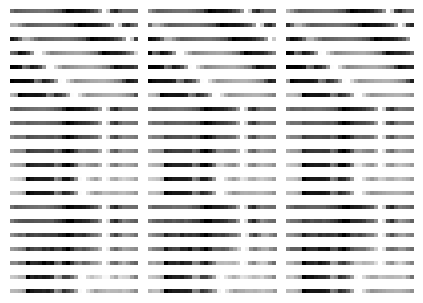

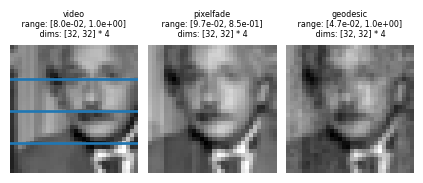

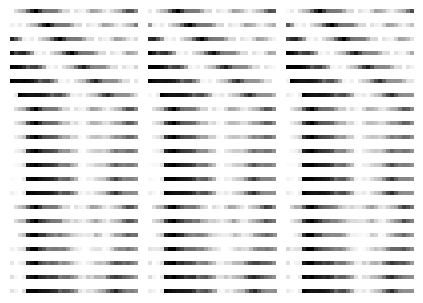

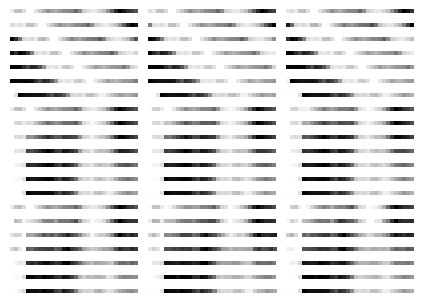

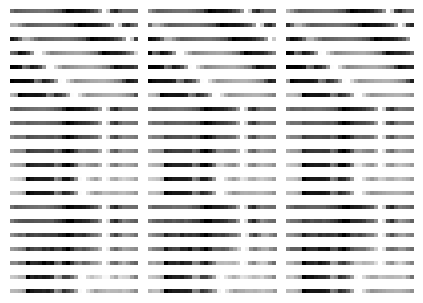

In [10]:
# Convert tensors to numpy arrays
pixelfade = to_numpy(moog.pixelfade)
geodesic = to_numpy(moog.geodesic)

# Add an additional dimension to the images (batch, channel, height, width)
video = video.reshape(21, 1, 32, 32)
pixelfade = pixelfade.reshape(21, 1, 32, 32)
geodesic = geodesic.reshape(21, 1, 32, 32)

# Display the 5th image from each array
fig = po.imshow(
    [video[5].reshape(1, 1, 32, 32), pixelfade[5].reshape(1, 1, 32, 32), geodesic[5].reshape(1, 1, 32, 32)],
    title=["video", "pixelfade", "geodesic"],
    col_wrap=3,
    zoom=4,
)

# Define size and lines
size = geodesic.shape[-1]
h, m, l = (size // 2 + size // 4, size // 2, size // 2 - size // 4)

# Add horizontal lines to the plot
a = fig.get_axes()[0]
for line in (h, m, l):
    a.axhline(line, lw=2)



# Display specific rows across all images in the batch
po.imshow(
    [video[:, :, l, :].reshape(21,1,1,32), pixelfade[:, :, l, :].reshape(21,1,1,32), geodesic[:, :, l, :].reshape(21,1,1,32)], title=None, col_wrap=3, zoom=4
)
po.imshow(
    [video[:, :, m, :].reshape(21,1,1,32), pixelfade[:, :, m, :].reshape(21,1,1,32), geodesic[:, :, m, :].reshape(21,1,1,32)], title=None, col_wrap=3, zoom=4
)
po.imshow(
    [video[:, :, h, :].reshape(21,1,1,32), pixelfade[:, :, h, :].reshape(21,1,1,32), geodesic[:, :, h, :].reshape(21,1,1,32)], title=None, col_wrap=3, zoom=4
)

### Physiologically inspired models

/mnt/home/hdettki/code/plenoptic/src/plenoptic/simulate/models/frontend.py:388: UserWarning: pretrained is True but cache_filt is False. Set cache_filt to True for efficiency unless you are fine-tuning.
  warn("pretrained is True but cache_filt is False. Set cache_filt to "
/mnt/home/hdettki/.virtualenvs/plenoptic/lib/python3.10/site-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


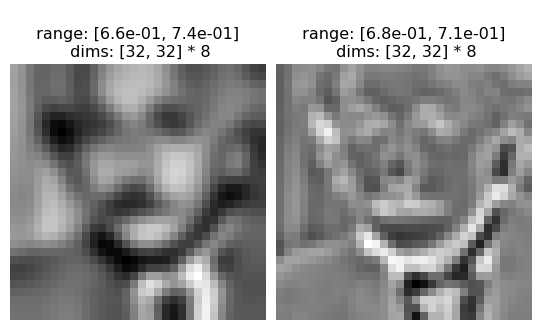

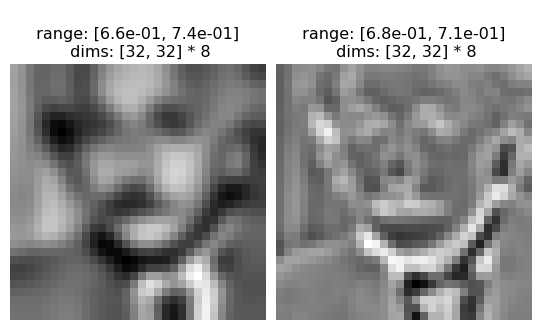

In [11]:
model = po.simul.OnOff(kernel_size=(31, 31), pretrained=True)
po.tools.remove_grad(model)
po.imshow(model(imgA), zoom=8)

In [12]:
n_steps = 10
moog = po.synth.Geodesic(imgA, imgB, model, n_steps, initial_sequence="bridge")

In [13]:
moog.synthesize(store_progress=True)


 Stop criterion for pixel_change_norm = 7.76675e-03


  0%|          | 0/1000 [00:00<?, ?it/s]

<Axes: title={'center': 'Deviation from the straight line'}, xlabel='Distance along representation line', ylabel='Distance from representation line'>

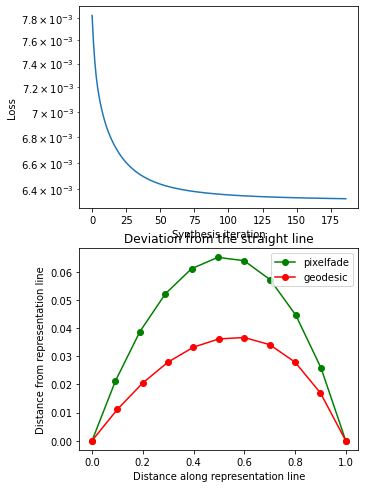

In [14]:
fig, axes = plt.subplots(2, 1, figsize=(5, 8))
po.synth.geodesic.plot_loss(moog, ax=axes[0])
po.synth.geodesic.plot_deviation_from_line(moog, ax=axes[1])

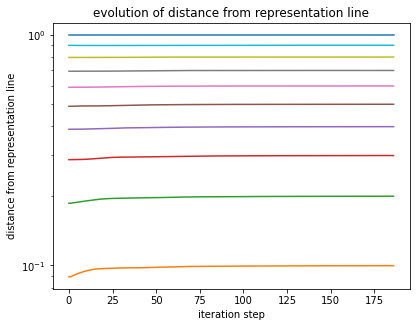

In [15]:
plt.plot(po.to_numpy(moog.dev_from_line[..., 0]))

plt.title("evolution of distance from representation line")
plt.ylabel("distance from representation line")
plt.xlabel("iteration step")
plt.yscale("log")
plt.show()

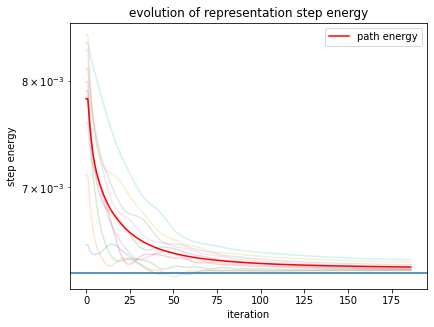

In [16]:
plt.plot(po.to_numpy(moog.step_energy), alpha=0.2)
plt.plot(moog.step_energy.mean(1), "r-", label="path energy")
plt.axhline(
    torch.linalg.vector_norm(moog.model(moog.image_a) - moog.model(moog.image_b), ord=2)
    ** 2
    / moog.n_steps**2
)
plt.legend()
plt.title("evolution of representation step energy")
plt.ylabel("step energy")
plt.xlabel("iteration")
plt.yscale("log")
plt.show()

Text(0.5, 1.0, 'final representation step jerkiness')

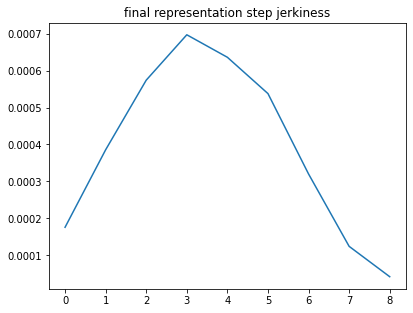

In [17]:
plt.plot(moog.calculate_jerkiness().detach())
plt.title("final representation step jerkiness")

In [18]:
geodesic = po.to_numpy(moog.geodesic).squeeze()
pixelfade = po.to_numpy(moog.pixelfade).squeeze()
assert geodesic.shape == pixelfade.shape
geodesic.shape

(11, 32, 32)

geodesic
diff
pixelfade


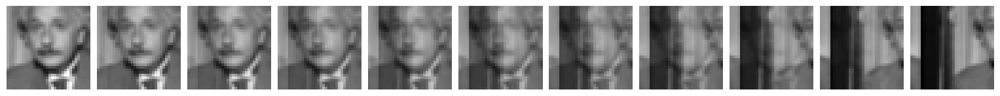

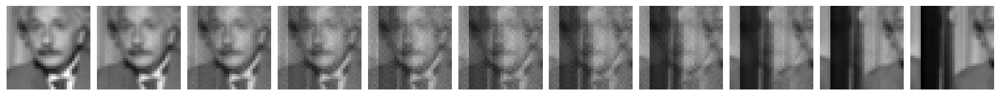

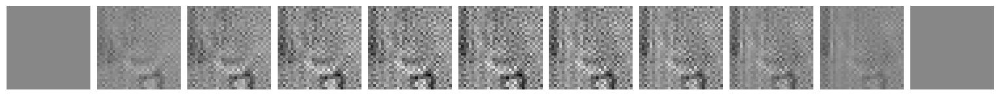

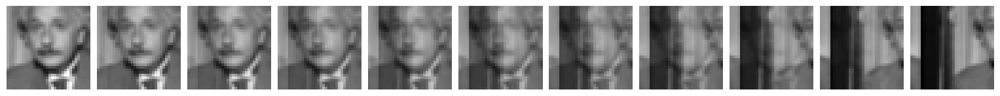

In [20]:

print("geodesic")
pt.imshow(list(geodesic), vrange="auto1", title=None, zoom=4)
print("diff")
pt.imshow(list(geodesic - pixelfade), vrange="auto1", title=None, zoom=4)
print("pixelfade")
pt.imshow(list(pixelfade), vrange="auto1", title=None, zoom=4)

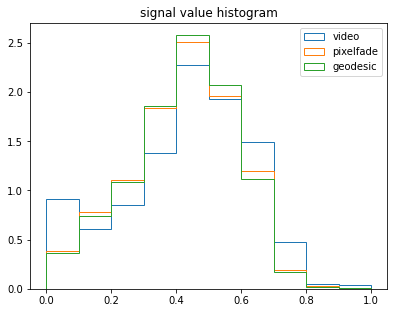

In [21]:
# checking that the range constraint is met
plt.hist(video.flatten(), histtype="step", density=True, label="video")
plt.hist(pixelfade.flatten(), histtype="step", density=True, label="pixelfade")
plt.hist(geodesic.flatten(), histtype="step", density=True, label="geodesic")
plt.title("signal value histogram")
plt.legend(loc=1)
plt.show()

## vgg16 translation / rotation / scaling  

100%|█████████████████████████████████████| 1.48M/1.48M [00:00<00:00, 2.56GB/s]
Untarring contents of '/dev/shm/.cache-hdettki/plenoptic/sample_images.tar.gz' to '/dev/shm/.cache-hdettki/plenoptic/sample_images.tar.gz.untar'


Difference statistics:
  Range: [0, 0]
  Mean: -0.012635,  Stdev (rmse): 0.208685,  SNR (dB): 0.856129


(-0.8156863, 0.8784314, -0.012635445, 0.20868470168844744, 0.8561294399622663)

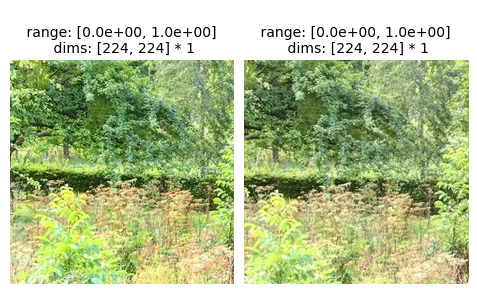

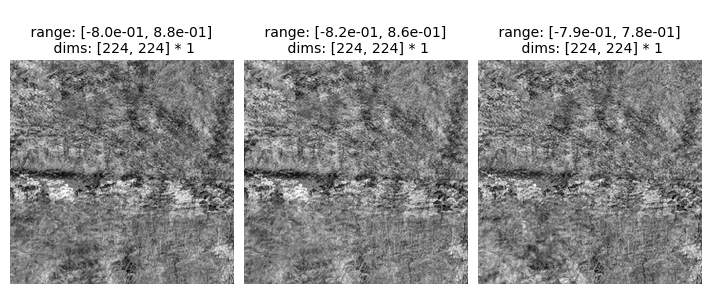

In [22]:
# We have some optional example images that we'll download for this. In order to do so,
# we use an optional dependency, pooch. If the following raises an ImportError or ModuleNotFoundError for you,
# then install pooch in your plenoptic environment and restart your kernel.
sample_image_dir = po.data.fetch_data("sample_images.tar.gz")
imgA = po.load_images(sample_image_dir / "frontwindow_affine.jpeg", as_gray=False)
imgB = po.load_images(sample_image_dir / "frontwindow.jpeg", as_gray=False)
u = 300
l = 90
imgA = imgA[..., u : u + 224, l : l + 224]
imgB = imgB[..., u : u + 224, l : l + 224]
po.imshow([imgA, imgB], as_rgb=True)
diff = imgA - imgB
po.imshow(diff)
pt.image_compare(po.to_numpy(imgA, True), po.to_numpy(imgB, True))

In [23]:
from torchvision import models


# Create a class that takes the nth layer output of a given model
class NthLayer(torch.nn.Module):
    """Wrap any model to get the response of an intermediate layer

    Works for Resnet18 or VGG16.

    """

    def __init__(self, model, layer=None):
        """
        Parameters
        ----------
        model: PyTorch model
        layer: int
            Which model response layer to output
        """
        super().__init__()

        # TODO
        # is centrering appropriate???
        self.normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
        )
        try:
            # then this is VGG16
            features = list(model.features)
        except AttributeError:
            # then it's resnet18
            features = (
                [model.conv1, model.bn1, model.relu, model.maxpool]
                + [l for l in model.layer1]
                + [l for l in model.layer2]
                + [l for l in model.layer3]
                + [l for l in model.layer4]
                + [model.avgpool, model.fc]
            )
        self.features = nn.ModuleList(features).eval()

        if layer is None:
            layer = len(self.features)
        self.layer = layer

    def forward(self, x):

        x = self.normalize(x)
        for ii, mdl in enumerate(self.features):
            x = mdl(x)
            if ii == self.layer:
                return x


# different potential models of human visual perception of distortions
# resnet18 = NthLayer(models.resnet18(pretrained=True), layer=3)

# choosing what layer representation to study
# for l in range(len(models.vgg16().features)):
#     print(f'({l}) ', models.vgg16().features[l])
#     y = NthLayer(models.vgg16(pretrained=True), layer=l)(imgA)
#     print("dim", torch.numel(y), "shape ", y.shape,)

vgg_pool1 = NthLayer(models.vgg16(pretrained=True), layer=4)
po.tools.remove_grad(vgg_pool1)
vgg_pool2 = NthLayer(models.vgg16(pretrained=True), layer=9)
po.tools.remove_grad(vgg_pool2)
vgg_pool3 = NthLayer(models.vgg16(pretrained=True), layer=17)
po.tools.remove_grad(vgg_pool3)

/mnt/home/hdettki/.virtualenvs/plenoptic/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/mnt/home/hdettki/.virtualenvs/plenoptic/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /dev/shm/.cache-hdettki/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 166MB/s] 


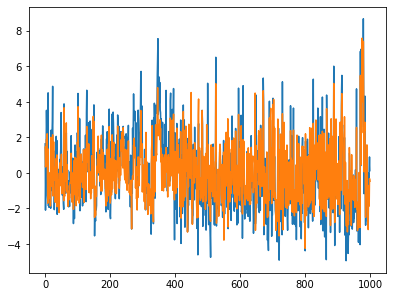

In [24]:
predA = po.to_numpy(models.vgg16(pretrained=True)(imgA))[0]
predB = po.to_numpy(models.vgg16(pretrained=True)(imgB))[0]

plt.plot(predA)
plt.plot(predB)

The following block runs `curl` (which should be automatically installed on your system) to download a `txt` file containing the ImageNet class labels. If it doesn't run for some reason, you can download it yourself from [here](https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt) and place it at `../data/imagenet1000_clsidx_to_labels.txt`.

In [ ]:
!curl https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt -o ../data/imagenet1000_clsidx_to_labels.txt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 30564  100 30564    0     0  81532      0 --:--:-- --:--:-- --:--:-- 81721


In [25]:
with open("../data/imagenet1000_clsidx_to_labels.txt") as f:
    idx2label = eval(f.read())

for idx in np.argsort(predA)[-5:]:
    print(idx2label[idx])
for idx in np.argsort(predB)[-5:]:
    print(idx2label[idx])

FileNotFoundError: [Errno 2] No such file or directory: '../data/imagenet1000_clsidx_to_labels.txt'

In [26]:
moog = po.synth.Geodesic(imgA, imgB, vgg_pool3)

/mnt/home/hdettki/code/plenoptic/src/plenoptic/tools/validate.py:178: UserWarning: model is in training mode, you probably want to call eval() to switch to evaluation mode
  warnings.warn(


In [27]:
# this should be run for longer on a GPU
moog.synthesize(max_iter=25)


 Stop criterion for pixel_change_norm = 1.23674e-01


  0%|          | 0/25 [00:00<?, ?it/s]

<Axes: title={'center': 'Deviation from the straight line'}, xlabel='Distance along representation line', ylabel='Distance from representation line'>

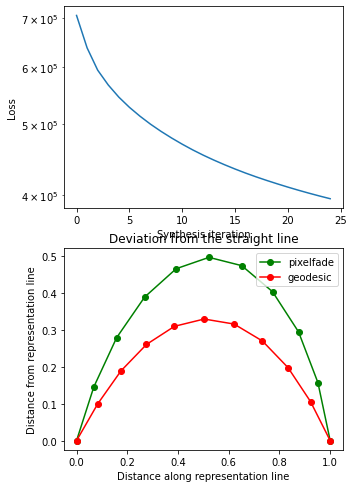

In [28]:
fig, axes = plt.subplots(2, 1, figsize=(5, 8))
po.synth.geodesic.plot_loss(moog, ax=axes[0])
po.synth.geodesic.plot_deviation_from_line(moog, ax=axes[1])

Text(0.5, 1.0, 'final representation step jerkiness')

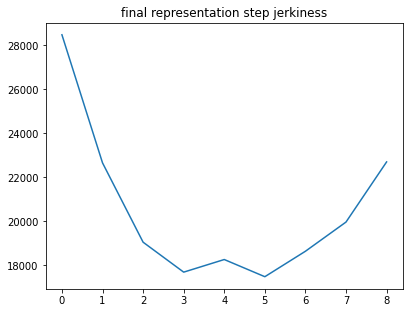

In [29]:
plt.plot(moog.calculate_jerkiness().detach())
plt.title("final representation step jerkiness")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005088643..1.0093768].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008127141..1.0136089].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0105383415..1.0117748].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0019017685..1.0129464].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0032100033..1.0187235].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0049446826..1.0163808].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got 

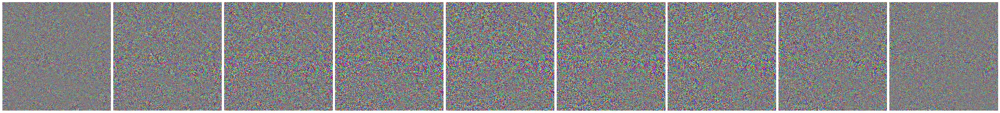

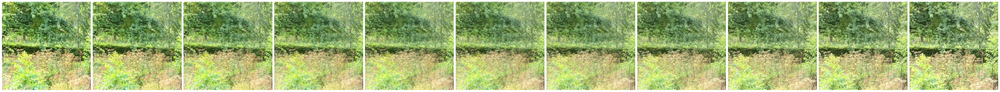

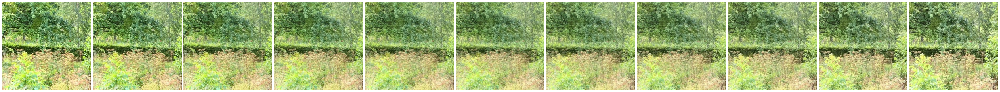

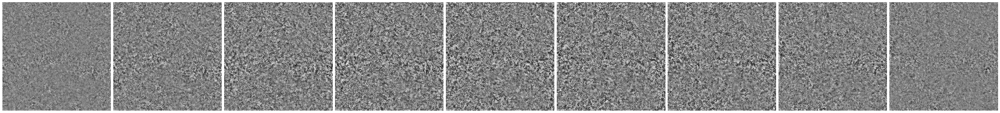

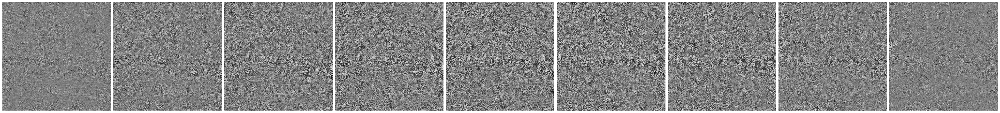

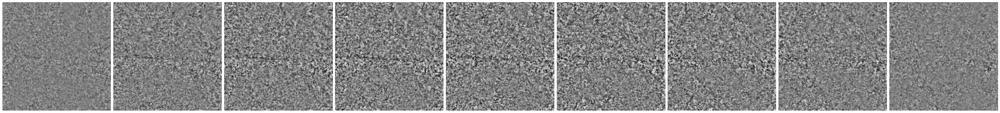

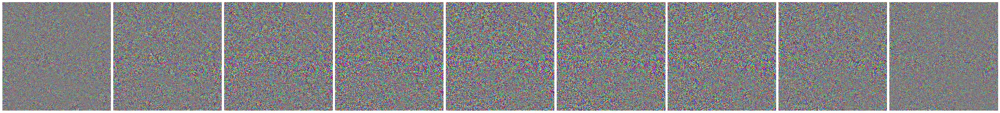

In [30]:
po.imshow(moog.geodesic, as_rgb=True, zoom=2, title=None, vrange="auto0")
po.imshow(moog.pixelfade, as_rgb=True, zoom=2, title=None, vrange="auto0")
# per channel difference
po.imshow(
    [(moog.geodesic - moog.pixelfade)[1:-1, 0:1]], zoom=2, title=None, vrange="auto1"
)
po.imshow(
    [(moog.geodesic - moog.pixelfade)[1:-1, 1:2]], zoom=2, title=None, vrange="auto1"
)
po.imshow(
    [(moog.geodesic - moog.pixelfade)[1:-1, 2:]], zoom=2, title=None, vrange="auto1"
)
# exaggerated color difference
po.imshow(
    [po.tools.rescale((moog.geodesic - moog.pixelfade)[1:-1])],
    as_rgb=True,
    zoom=2,
    title=None,
)